In [1]:
import pandas as pd
import sys
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
sys.path.append('../../')

from scoring.event_detection_matrix import competition_score
from tqdm import tqdm

## Daten laden

In [2]:
predictions = pd.read_parquet('./data/predicted_series.parquet')
validation_events = pd.read_csv('../../data/processed/validation_events_split.csv')

In [3]:
predictions['series_id'] = predictions['num_series_id']

In [4]:
predictions.dtypes

step                         int64
num_series_id                int64
awake                        int64
prediction_class             int64
prediction_confidence_0    float64
prediction_confidence_1    float64
series_id                    int64
dtype: object

In [5]:
predictions['correct_prediction'] = (predictions['awake'] == predictions['prediction_class']).replace({True: 1, False: 0})

## Event Extraction

In [6]:
def get_events_smoothed(test_series) :
    series_ids = test_series['num_series_id'].unique()
    events = []

    for idx in tqdm(series_ids):
        # Collecting sample and normalizing features
        X = test_series[test_series.num_series_id == idx]
                
        smoothing_length = 12 * 30 # 30 Minutes
        # We average the confidence, that the participant is awake
        X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
        X["asleep"] = X["prediction_confidence_0"].rolling(smoothing_length, center=True).mean().bfill().ffill()

        # Binarize the asleep column
        X["asleep"] = X["asleep"].round()

        # Getting predicted onset and wakeup time steps
        pred_onsets = X[X['asleep'].diff() > 0]['step'].tolist() # diff is > 0 if it changes from 0 (awake) to 1 (asleep)
        pred_wakeups = X[X['asleep'].diff() < 0]['step'].tolist() # diff is < 0 if it changes from 1 (asleep) to 0 (awake)
     
        if len(pred_onsets) > 0:

            # Ensuring all predicted sleep periods begin and end
            if min(pred_wakeups) < min(pred_onsets):
                pred_wakeups = pred_wakeups[1:]

            if max(pred_onsets) > max(pred_wakeups):
                pred_onsets = pred_onsets[:-1]

            # Keeping sleep periods longer than 30 minutes
            sleep_periods = [(onset, wakeup) for onset, wakeup in zip(pred_onsets, pred_wakeups) if wakeup - onset >= 12 * 30]

            for onset, wakeup in sleep_periods:
                # We take the score
                score = 1 - X[(X['step'] >= onset) & (X['step'] < wakeup)]['confidence_awake'].mean()

                # Adding sleep event to dataframe
                onset_row = {'row_id': len(events), 'series_id': idx, 'step': onset, 'event': 'onset', 'score': score}                
                events.append(onset_row)

                wakeup_row = {'row_id': len(events), 'series_id': idx, 'step': wakeup, 'event': 'wakeup', 'score': score}
                events.append(wakeup_row)

    return pd.DataFrame(events)

In [7]:
predicted_events = get_events_smoothed(predictions)

  0%|          | 0/54 [00:00<?, ?it/s]/tmp/ipykernel_149/2987299727.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
/tmp/ipykernel_149/2987299727.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_confidence_0"].rolling(smoothing_length, center=True).mean().bfill().ffill()
/tmp/ipykernel_149/2987299727.py:15: SettingWithCopyWarning: 
A value is trying to be se

 57%|███████████████████████████████████████████████                                   | 31/54 [00:03<00:02,  9.06it/s]C:\Users\Michael Jakober\AppData\Local\Temp\ipykernel_16184\2987299727.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
C:\Users\Michael Jakober\AppData\Local\Temp\ipykernel_16184\2987299727.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_co

 69%|████████████████████████████████████████████████████████▏                         | 37/54 [00:03<00:01, 10.50it/s]C:\Users\Michael Jakober\AppData\Local\Temp\ipykernel_16184\2987299727.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
C:\Users\Michael Jakober\AppData\Local\Temp\ipykernel_16184\2987299727.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_co

 80%|█████████████████████████████████████████████████████████████████▎                | 43/54 [00:04<00:01,  9.74it/s]C:\Users\Michael Jakober\AppData\Local\Temp\ipykernel_16184\2987299727.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
C:\Users\Michael Jakober\AppData\Local\Temp\ipykernel_16184\2987299727.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_co

 93%|███████████████████████████████████████████████████████████████████████████▉      | 50/54 [00:05<00:00,  9.16it/s]C:\Users\Michael Jakober\AppData\Local\Temp\ipykernel_16184\2987299727.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["confidence_awake"] = X["prediction_confidence_1"].rolling(smoothing_length, center=True).mean().bfill().ffill()
C:\Users\Michael Jakober\AppData\Local\Temp\ipykernel_16184\2987299727.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X["asleep"] = X["prediction_co

In [8]:
sample = predictions[predictions.num_series_id == 123]

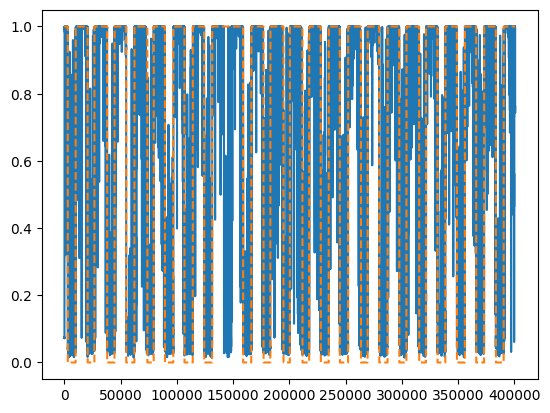

In [9]:
plt.plot(sample['step'], sample['prediction_confidence_1'])
plt.plot(sample['step'], sample['awake'], linestyle='dashed')
plt.show()

## Accuracy pro Serie

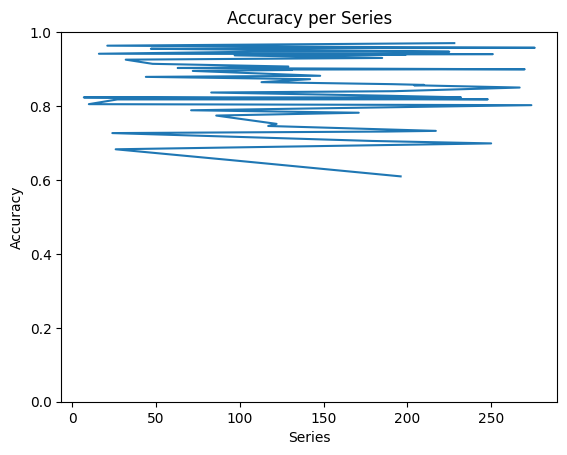

In [10]:
ax = predictions.groupby('series_id')['correct_prediction'].mean().sort_values().plot(
    ylim=(0, 1), title='Accuracy per Series'
)
ax.set_ylabel("Accuracy")
ax.set_xlabel("Series")

fig = ax.get_figure()
fig.savefig("accuracy-per-series.png", bbox_inches="tight")

## Competition Score pro Serie

In [11]:
validation_events['series_id'] = validation_events['num_series_id']

In [12]:
series_ids = predicted_events.series_id.unique()
scores = []

for series_id in tqdm(series_ids):
    predicted_events_series = predicted_events[predicted_events.series_id == series_id]
    true_events_series = validation_events[validation_events.series_id == series_id]

    score = competition_score(true_events_series, predicted_events_series)
    
    scores.append({'series_id': str(series_id), 'score': score})

scores = pd.DataFrame(scores)

100%|██████████| 54/54 [00:17<00:00,  3.16it/s]


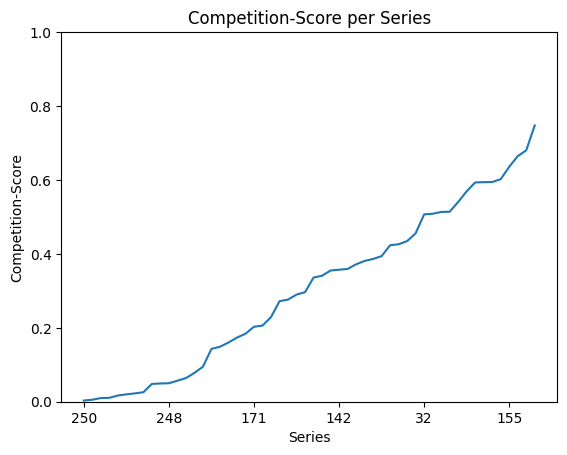

In [13]:
ax = scores.groupby('series_id')['score'].mean().sort_values().plot(
    ylim=(0, 1), title='Competition-Score per Series'
)
ax.set_ylabel("Competition-Score")
ax.set_xlabel("Series")
#ax.set_xticks(ticks=[*range(1, len(series), 2)], labels=series[::2], rotation=90)

fig = ax.get_figure()
fig.savefig("comp-score-per-series.png", bbox_inches="tight")

## Daten visualisieren

In [14]:
participant_series_id = 123
participant_series = predictions[predictions.series_id == participant_series_id]
participant_series = participant_series[0:100_000]

participant_events = predicted_events[predicted_events.series_id == participant_series_id]
participant_events = participant_events[0:12]

participant_true_events = validation_events[validation_events.series_id == participant_series_id]
participant_true_events = participant_true_events[0:12]

In [15]:
participant_series

,step,num_series_id,awake,prediction_class,prediction_confidence_0,prediction_confidence_1,series_id,correct_prediction
8954640,0,123,1,0,0.926310,0.073690,123,0
8954641,1,123,1,0,0.926536,0.073464,123,0
8954642,2,123,1,0,0.926366,0.073634,123,0
8954643,3,123,1,0,0.925917,0.074083,123,0
8954644,4,123,1,0,0.925930,0.074070,123,0
...,...,...,...,...,...,...,...,...
9054635,99995,123,1,1,0.000430,0.999570,123,1
9054636,99996,123,1,1,0.000589,0.999411,123,1
9054637,99997,123,1,1,0.000680,0.999321,123,1
9054638,99998,123,1,1,0.000672,0.999328,123,1


In [16]:
participant_true_events

,series_id,night,event,step,timestamp,num_series_id
1206,123,1,onset,3060.0,2017-09-21T20:45:00-0400,123
1207,123,1,wakeup,10080.0,2017-09-22T06:30:00-0400,123
1208,123,2,onset,20700.0,2017-09-22T21:15:00-0400,123
1209,123,2,wakeup,26736.0,2017-09-23T05:38:00-0400,123
1210,123,3,onset,38064.0,2017-09-23T21:22:00-0400,123
1211,123,3,wakeup,44628.0,2017-09-24T06:29:00-0400,123
1212,123,4,onset,54984.0,2017-09-24T20:52:00-0400,123
1213,123,4,wakeup,62304.0,2017-09-25T07:02:00-0400,123
1214,123,5,onset,73800.0,2017-09-25T23:00:00-0400,123
1215,123,5,wakeup,79452.0,2017-09-26T06:51:00-0400,123


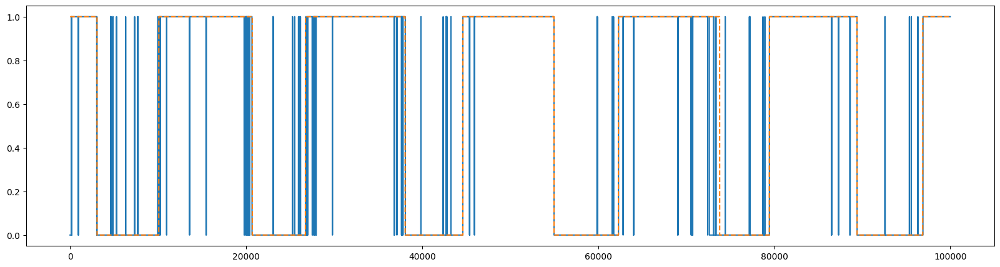

In [17]:
fig, ax = plt.subplots(figsize=(20, 5))
plt.plot(participant_series['step'], participant_series['prediction_class'])
plt.plot(participant_series['step'], participant_series['awake'], linestyle='dashed')
plt.show()

In [18]:
fig = px.line(participant_series, x='step', y='prediction_confidence_1', title=f'Schlafdaten für {participant_series_id}')
for index, row in participant_events.dropna().iterrows():
    color = 'orange' if row.event == 'onset' else 'red' 
    fig.add_vline(x=row.step, line_width=1, line_dash='dash', line_color=color)
    
for index, row in participant_true_events.dropna().iterrows():
    color = 'orange' if row.event == 'onset' else 'red' 
    fig.add_vline(x=row.step, line_width=1, line_color=color)

#Custom Legend
fig.add_trace(
    go.Scatter(
        x=[None],
        y=[None],
        line=dict(color='orange', width=2, dash='dash'),
        name="onset event",
    )
)
fig.add_trace(
    go.Scatter(
        x=[None],
        y=[None],
        line=dict(color='red', width=2, dash='dash'),
        name="wakeup event",
    )
)
fig.update_layout(legend_title="Events")
    
fig.show()

## Analysis for different thresholds

In [19]:
import sys
sys.path.append('../')

from scoring.event_detection_ap import score

In [20]:
base_tolerances = [12, 36, 60, 90, 120, 150, 180, 240, 300, 360]

column_names = {
    'series_id_column_name': 'series_id',
    'time_column_name': 'step',
    'event_column_name': 'event',
    'score_column_name': 'score',
}

In [21]:
validation_events = validation_events[validation_events.step.notnull()]
validation_events

,series_id,night,event,step,timestamp,num_series_id
0,7,1,onset,7872.0,2018-08-22T23:11:00-0400,7
1,7,1,wakeup,14484.0,2018-08-23T08:22:00-0400,7
6,7,4,onset,60720.0,2018-08-26T00:35:00-0400,7
7,7,4,wakeup,68400.0,2018-08-26T11:15:00-0400,7
8,7,5,onset,77304.0,2018-08-26T23:37:00-0400,7
...,...,...,...,...,...,...
2955,276,33,wakeup,565824.0,2019-04-28T06:52:00-0400,276
2956,276,34,onset,577344.0,2019-04-28T22:52:00-0400,276
2957,276,34,wakeup,584052.0,2019-04-29T08:11:00-0400,276
2958,276,35,onset,595344.0,2019-04-29T23:52:00-0400,276


In [22]:
competition_score(validation_events, predicted_events)

0.415571627903395

In [23]:
comp_scores = []
for i in range(0, 10):
    tolerances = {
        'onset': base_tolerances[:i+1],
        'wakeup': base_tolerances[:i+1],
    }
    comp_scores.append(score(validation_events, predicted_events, tolerances, **column_names))
    print(f'Competition-Score for tolerances {base_tolerances[:i+1]}: {comp_scores[-1]}')

Competition-Score for tolerances [12]: 0.028266310901297102
Competition-Score for tolerances [12, 36]: 0.08542718735696644
Competition-Score for tolerances [12, 36, 60]: 0.13738549436553238
Competition-Score for tolerances [12, 36, 60, 90]: 0.1855811499014494
Competition-Score for tolerances [12, 36, 60, 90, 120]: 0.231263937335337
Competition-Score for tolerances [12, 36, 60, 90, 120, 150]: 0.2773279268821926
Competition-Score for tolerances [12, 36, 60, 90, 120, 150, 180]: 0.31794105329243527
Competition-Score for tolerances [12, 36, 60, 90, 120, 150, 180, 240]: 0.3550823018645527
Competition-Score for tolerances [12, 36, 60, 90, 120, 150, 180, 240, 300]: 0.38692671368542686
Competition-Score for tolerances [12, 36, 60, 90, 120, 150, 180, 240, 300, 360]: 0.415571627903395


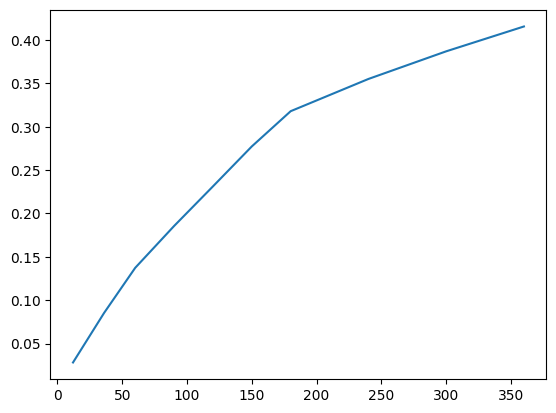

In [24]:
plt.plot(base_tolerances, comp_scores)

In [25]:
single_comp_scores = []
for i in range(0, 10):
    tolerances = {
        'onset': base_tolerances[i:i+1],
        'wakeup': base_tolerances[i:i+1],
    }
    single_comp_scores.append(score(validation_events, predicted_events, tolerances, **column_names))
    print(f'Competition-Score for tolerance {base_tolerances[i:i+1]}: {single_comp_scores[-1]}')

Competition-Score for tolerance [12]: 0.028266310901297102
Competition-Score for tolerance [36]: 0.14258806381263578
Competition-Score for tolerance [60]: 0.24130210838266425
Competition-Score for tolerance [90]: 0.33016811650920047
Competition-Score for tolerance [120]: 0.4139950870708875
Competition-Score for tolerance [150]: 0.5076478746164705
Competition-Score for tolerance [180]: 0.5616198117538912
Competition-Score for tolerance [240]: 0.6150710418693748
Competition-Score for tolerance [300]: 0.6416820082524199
Competition-Score for tolerance [360]: 0.6733758558651086


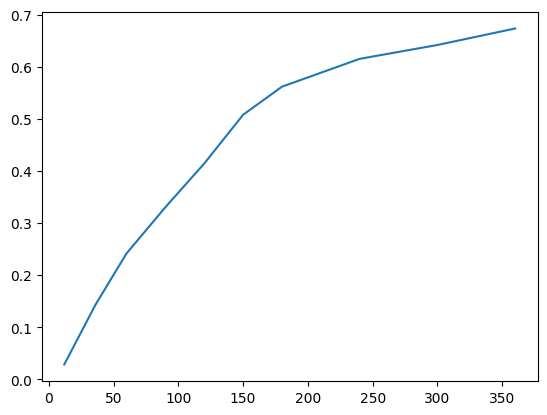

In [26]:
plt.plot(base_tolerances, single_comp_scores)

## Event Accuracy

In [64]:
def annotate_closest_events(predicted_events, true_events):

    for i, row in tqdm(predicted_events.iterrows()):
        series = true_events[(true_events.series_id == row.series_id) & (true_events.event == row.event)]
        predicted_step = row.step
        closest_index = (series['step'] - predicted_step).abs().idxmin()

        closest_step = true_events.loc[closest_index, 'step']
    
        # Set the 'closest' column to 1 for the row with the closest value
        predicted_events.loc[i, 'difference'] = abs(predicted_step - closest_step)

    return predicted_events

In [65]:
predicted_events = annotate_closest_events(predicted_events, validation_events)


0it [00:00, ?it/s]
96it [00:00, 959.26it/s]
265it [00:00, 1384.93it/s]
433it [00:00, 1518.12it/s]
602it [00:00, 1585.85it/s]
771it [00:00, 1621.92it/s]
939it [00:00, 1640.73it/s]
1107it [00:00, 1650.40it/s]
1274it [00:00, 1655.57it/s]
1442it [00:00, 1661.89it/s]
1610it [00:01, 1666.22it/s]
1778it [00:01, 1669.17it/s]
1945it [00:01, 1669.04it/s]
2112it [00:01, 1668.59it/s]
2279it [00:01, 1668.77it/s]
2447it [00:01, 1670.73it/s]
2615it [00:01, 1669.81it/s]
2784it [00:01, 1673.90it/s]
2952it [00:01, 1673.61it/s]
3121it [00:01, 1675.53it/s]
3289it [00:02, 1676.65it/s]
3457it [00:02, 1674.68it/s]
3625it [00:02, 1673.30it/s]
3793it [00:02, 1674.59it/s]
3976it [00:02, 1644.65it/s]


In [70]:
events = predicted_events[predicted_events.difference < 360]
print(f'There are {len(threshold_events)} of {len(predicted_events)} Events that are inside the 30 Minute threshold ({(len(events) / len(predicted_events) * 100):.2f}%)')

events = predicted_events[predicted_events.difference >= 360]
print(f'There are {len(events)} of {len(predicted_events)} Events that are outside the 30 Minute threshold ({(len(events) / len(predicted_events) * 100):.2f}%)')

There are 1529 of 3976 Events that are inside the 30 Minute threshold (38.46%)
There are 2447 of 3976 Events that are outside the 30 Minute threshold (61.54%)


In [71]:
for i in range(1, 6):
    events = predicted_events[predicted_events.difference > i*12*60*24]
    print(f'There are {len(events)} Events that are at least {i} days off the closest true event')

There are 970 Events that are at least 1 days off the closest true event
There are 608 Events that are at least 2 days off the closest true event
There are 470 Events that are at least 3 days off the closest true event
There are 406 Events that are at least 4 days off the closest true event
There are 344 Events that are at least 5 days off the closest true event


In [81]:
previous_event_size = 0
previous_tolerance = 0
events_in_threshold = len(predicted_events[predicted_events.difference < 360])
for tolerance in base_tolerances:
    events = predicted_events[predicted_events.difference < tolerance]
    print(f'There are {len(events) - previous_event_size} Events that are between {previous_tolerance / 12} - {tolerance / 12} Minutes of the closest true event ({((len(events) - previous_event_size) / events_in_threshold * 100):.2f}%)')
    previous_event_size = len(events)
    previous_tolerance = tolerance

There are 285 Events that are between 0.0 - 1.0 Minutes of the closest true event (18.64%)
There are 385 Events that are between 1.0 - 3.0 Minutes of the closest true event (25.18%)
There are 211 Events that are between 3.0 - 5.0 Minutes of the closest true event (13.80%)
There are 169 Events that are between 5.0 - 7.5 Minutes of the closest true event (11.05%)
There are 126 Events that are between 7.5 - 10.0 Minutes of the closest true event (8.24%)
There are 123 Events that are between 10.0 - 12.5 Minutes of the closest true event (8.04%)
There are 78 Events that are between 12.5 - 15.0 Minutes of the closest true event (5.10%)
There are 72 Events that are between 15.0 - 20.0 Minutes of the closest true event (4.71%)
There are 37 Events that are between 20.0 - 25.0 Minutes of the closest true event (2.42%)
There are 43 Events that are between 25.0 - 30.0 Minutes of the closest true event (2.81%)


In [82]:
len(validation_events)

1730